In [6]:
try:
    import openseespy.opensees as ops
except:
    import opensees as ops

import numpy as np

In [7]:
PI

NameError: name 'PI' is not defined

In [8]:
import opsvis as opsv
import matplotlib.pyplot as plt

In [3]:
from LibsUnits import *
from SectionGenerator import *

ops.wipe()
ops.model('basic', '-ndm', 2, '-ndf', 3)

LCol = [12.0, 12.0, 18.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0, 13.0]
LCol = [i * ft for i in LCol]

LBeam = 20*ft;
currentHeight = 0;
NBay = 5;
floorNumber = 0;

for floor in LCol:
    for column in range(1,NBay+2):
        ops.node(column*100+floorNumber, (column-1)*LBeam, currentHeight)
    floorNumber = floorNumber + 1
    currentHeight = currentHeight + floor

for column in range(1,7):
    ops.fix(column*100,*[1,1,0])

floorNumber = 2
for column in range(1,7):
    ops.fix(column*100+floorNumber,*[1,0,0])

for floorNumber in range(3,23):
    for colLine in range(2,7):
        ops.equalDOF(100+floorNumber,colLine*100+floorNumber,1)
        print(100+floorNumber,colLine*100+floorNumber)
FyCol = 345*MPa ;
EsCol=204*GPa  ;
b = 0.01
ops.uniaxialMaterial('Steel01',1,FyCol,EsCol,b)

FyCol = 248*MPa ;
EsBeam=204*GPa  ;
b = 0.01
ops.uniaxialMaterial('Steel01',2,FyCol,EsCol,b)

nfdw, nftw, nfbf, nftf = [4,1,1,4]
sectionDatasCol = [[27.5*inch, 1.38*inch, 13.5*inch, 2.48*inch],[26.7*inch,1.16*inch,13.3*inch,2.09*inch],[26.0*inch,0.96*inch,13.1*inch,1.73*inch],[25.0*inch,0.705*inch,13.0*inch,1.22*inch],[24.3*inch,0.550*inch,12.8*inch,0.850*inch],[24.3*inch,0.515*inch,9.07*inch,0.875*inch]];
secIterator = 1;
for sectionData in sectionDatasCol:
    d,tw,bf,tf = sectionData
    Wsection(secIterator,1,d, bf, tf, tw,nfdw, nftw, nfbf, nftf)
    secIterator= secIterator+1

sectionDatasColBox = [[15.0*inch,15.0*inch,2.0*inch],[15.0*inch,15.0*inch,1.25*inch],[15.0*inch,15.0*inch,1.0*inch],[15.0*inch,15.0*inch,0.75*inch],[15.0*inch,15.0*inch,0.5*inch]]
for sectionData in sectionDatasColBox:
    b,h,t = sectionData
    Boxsection(secIterator, 1, b,h,t, nfdw, nftw, nfbf, nftf)
    secIterator= secIterator+1

sectionDataBeam = [[13.7*inch,0.230*inch,5.0*inch,0.335*inch],[29.7*inch,0.520*inch,10.50*inch,0.670*inch],[29.80*inch,0.545*inch,10.50*inch,0.760*inch],[26.7*inch,0.460*inch,10.99*inch,0.640*inch],[23.7*inch,0.430*inch,7.04*inch,0.590*inch],[20.8*inch,0.375*inch,6.53*inch,0.535*inch]]
for sectionData in sectionDataBeam:
    d,tw,bf,tf = sectionData
    Wsection(secIterator,2,d, bf, tf, tw,nfdw, nftw, nfbf, nftf)
    secIterator= secIterator+1


for section in range(1,secIterator+1):
    ops.beamIntegration('Lobatto',int(section),int(section),5)

ops.geomTransf('Linear', 1)
ops.geomTransf('Linear', 2)

colListExterior = [7, 7, 7, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 11, 11]
ColumnExteriorLine = [1,6]
floorNumber = 0;
for colSection in colListExterior:
    for colLine in ColumnExteriorLine:
        nodeI = colLine*100+floorNumber;
        nodeJ = colLine*100+floorNumber+1;
        ops.element('forceBeamColumn',nodeI*1000+nodeJ,nodeI,nodeJ,1,colSection)
    floorNumber = floorNumber + 1;
    
colListInterior = [1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 6, 6]
ColumnInteriorLine = [2, 3, 4, 5]
floorNumber = 0;
for colSection in colListInterior:
    for colLine in ColumnInteriorLine:
        nodeI = colLine*100+floorNumber;
        nodeJ = colLine*100+floorNumber+1;
        ops.element('forceBeamColumn',nodeI*1000+nodeJ,nodeI,nodeJ,1,colSection)
    floorNumber = floorNumber + 1;

beamList = [13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 13, 13, 13, 13, 13, 13, 15, 15, 16, 17]
floorNumber = 2;
for beamSec in beamList:
    for colLine in range(1,6):
        nodeI = colLine*100+floorNumber;
        nodeJ = (colLine+1)*100+floorNumber;
        ops.element('forceBeamColumn',nodeI*1000+nodeJ,nodeI,nodeJ,2,beamSec)
    floorNumber = floorNumber +1;

W3099A= 29.0*inch*inch; 
W3099I = 3990*inch*inch*inch*inch;

floorNumber = 1
for colLine in range(1,6):
    nodeI = colLine*100+floorNumber;
    nodeJ = (colLine+1)*100+floorNumber;
    ops.element('elasticBeamColumn', nodeI*1000+nodeJ, *[nodeI,nodeJ], W3099A, 204000*MPa, W3099I, 2, '-release', 3)

massFloor = [5.31220, 5.31220, 5.63320, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.5164, 5.83760]

massFloor = [i * kg *10**5/(2*5) for i in massFloor]

floorNumber = 1;
for mass in massFloor: 
    for colLine in range(1,7):
        if (colLine == 1 or colLine == 6):
            rotationalMass = LBeam**2*(10**-6)*mass/(2*210);
            ops.mass(colLine*100+floorNumber,mass/2,mass/2,rotationalMass)
        else:
            rotationalMass = LBeam**2*(10**-6)*mass/(210);
            ops.mass(colLine*100+floorNumber,mass,mass,rotationalMass)
    floorNumber = floorNumber+1
            
mass = massFloor[1]
rotationalMass = LBeam**2*(10**-6)*mass/(210);
ops.mass(200,0,0,rotationalMass)
ops.mass(300,0,0,rotationalMass)
ops.mass(400,0,0,rotationalMass)
ops.mass(500,0,0,rotationalMass)
rotationalMass = LBeam**2*(10**-6)*mass/(2*210);
ops.mass(100,0,0,rotationalMass)
ops.mass(600,0,0,rotationalMass)

Nmodes = 6 
w2 = ops.eigen(10)

# Pick your modes and damping ratios
wi = w2[0]**0.5; zetai = 0.02 # 2% in mode 1
wj = w2[5]**0.5; zetaj = 0.02 # 2% in mode 6

import numpy as np

A = np.array([[1/wi, wi],[1/wj, wj]])
b = np.array([zetai,zetaj])

x = np.linalg.solve(A,2*b)

#             M    KT  KI  Kn
ops.rayleigh(x[0],0.0,0.0,x[1])

103 203
103 303
103 403
103 503
103 603
104 204
104 304
104 404
104 504
104 604
105 205
105 305
105 405
105 505
105 605
106 206
106 306
106 406
106 506
106 606
107 207
107 307
107 407
107 507
107 607
108 208
108 308
108 408
108 508
108 608
109 209
109 309
109 409
109 509
109 609
110 210
110 310
110 410
110 510
110 610
111 211
111 311
111 411
111 511
111 611
112 212
112 312
112 412
112 512
112 612
113 213
113 313
113 413
113 513
113 613
114 214
114 314
114 414
114 514
114 614
115 215
115 315
115 415
115 515
115 615
116 216
116 316
116 416
116 516
116 616
117 217
117 317
117 417
117 517
117 617
118 218
118 318
118 418
118 518
118 618
119 219
119 319
119 419
119 519
119 619
120 220
120 320
120 420
120 520
120 620
121 221
121 321
121 421
121 521
121 621
122 222
122 322
122 422
122 522
122 622


In [4]:
import numpy as np
ops.wipeAnalysis()
ops.constraints('Transformation')
ops.system('FullGeneral')
ops.analysis('Transient')
ops.numberer('Plain')
# Mass
ops.integrator('GimmeMCK',1.0,0.0,0.0)
ops.analyze(1,0.0)
 
# Number of equations in the model
N = ops.systemSize() # Has to be done after analyze
 
M = ops.printA('-ret') # Or use ops.printA('-file','M.out')
M = np.array(M) # Convert the list to an array
M.shape = (N,N) # Make the array an NxN matrix
 
# Stiffness
ops.wipeAnalysis()
ops.constraints('Transformation')
ops.system('FullGeneral')
ops.analysis('Transient')
ops.numberer('Plain')
ops.integrator('GimmeMCK',0.0,0.0,1.0)
ops.analyze(1,0.0)
K = ops.printA('-ret')
K = np.array(K)
K.shape = (N,N)


# Damping
ops.wipeAnalysis()
ops.constraints('Transformation')
ops.system('FullGeneral')
ops.analysis('Transient')
ops.numberer('Plain')
ops.integrator('GimmeMCK',0.0,1.0,0.0)
ops.analyze(1,0.0)
C = ops.printA('-ret')
C = np.array(C)
C.shape = (N,N)

WARNING analysis Transient - no Algorithm yet specified, 
 NewtonRaphson default will be used
WARNING analysis Transient - no Numberer specified, 
 RCM default will be used
WARNING analysis Transient - no Integrator specified, 
 TransientIntegrator default will be used
WARNING analysis Transient - no Algorithm yet specified, 
 NewtonRaphson default will be used
WARNING analysis Transient - no Numberer specified, 
 RCM default will be used
WARNING analysis Transient - no Integrator specified, 
 TransientIntegrator default will be used
WARNING analysis Transient - no Algorithm yet specified, 
 NewtonRaphson default will be used
WARNING analysis Transient - no Numberer specified, 
 RCM default will be used
WARNING analysis Transient - no Integrator specified, 
 TransientIntegrator default will be used


In [5]:
np.savetxt('PyM.txt',M)
np.savetxt('PyK.txt',K)
np.savetxt('PyC.txt',C)

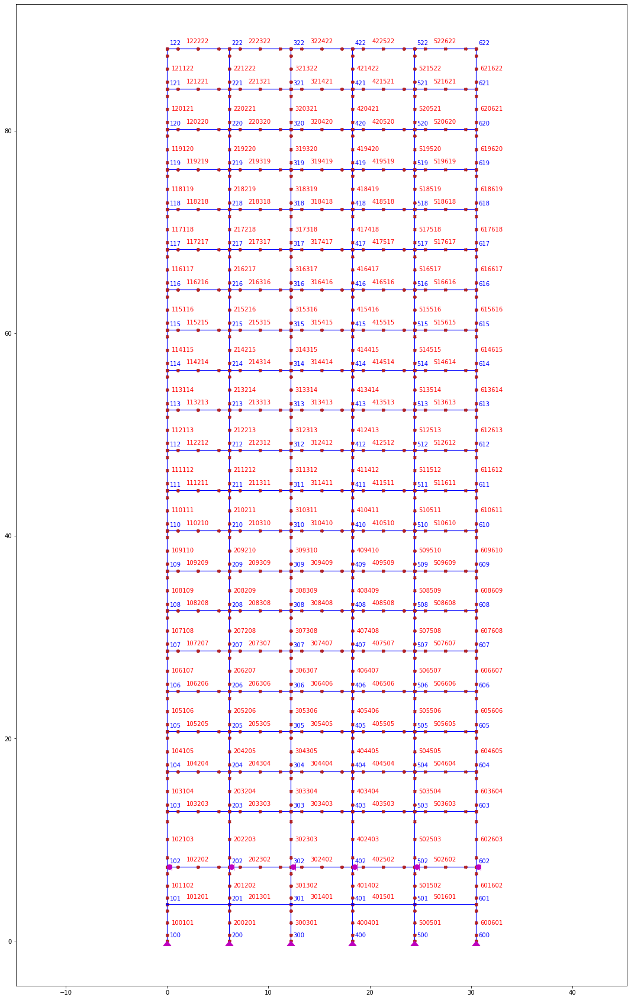

In [6]:
opsv.plot_model()
fig = plt.gcf()
fig.set_size_inches(18.5, 30.5)
plt.show()

In [7]:
ops.timeSeries('Path', 2, '-filePath', 'elcentro.txt', '-dt', 0.02, '-factor', 0.1*g,'-prependZero')
ops.pattern('UniformExcitation', 2, 1, '-accel', 2) #how to give accelseriesTag?

In [8]:
ops.wipeAnalysis()
ops.system('FullGeneral');
ops.constraints('Transformation')
ops.test('NormUnbalance',10e-8,20,2)
ops.algorithm('Newton')
ops.integrator('Newmark',0.5,0.25)
ops.analysis('Transient')

WARNING analysis Transient - no Numberer specified, 
 RCM default will be used


In [9]:
tCurrent = ops.getTime()
ok = 0
runTime = []
topDisp = []
topAccel = []

In [10]:
while ok == 0 and tCurrent < 45:
    
    ok = ops.analyze(1, .0005)
    
    # if the analysis fails try initial tangent iteration
    if ok != 0:
        break
    
    tCurrent = ops.getTime()

    runTime.append(tCurrent)
    topDisp.append(ops.nodeDisp(122,1))
    topAccel.append(ops.nodeAccel(122,1))

CTestNormUnbalance::test() - iteration: 2 current Norm: 9.78301e-08 (max: 1e-07, Norm deltaX: 5.96749e-17)
CTestNormUnbalance::test() - iteration: 3 current Norm: 1.08233e-08 (max: 1e-07, Norm deltaX: 7.06662e-18)
CTestNormUnbalance::test() - iteration: 2 current Norm: 9.22875e-08 (max: 1e-07, Norm deltaX: 4.69315e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 6.31567e-08 (max: 1e-07, Norm deltaX: 6.33024e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 5.57303e-08 (max: 1e-07, Norm deltaX: 5.71263e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 5.4719e-08 (max: 1e-07, Norm deltaX: 5.3811e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 5.57924e-08 (max: 1e-07, Norm deltaX: 5.45772e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 6.92814e-08 (max: 1e-07, Norm deltaX: 6.27301e-17)
CTestNormUnbalance::test() - iteration: 2 current Norm: 6.97166e-08 (max: 1e-07, Norm deltaX: 3.59541e-17)
CTestNormUnbalance::test() - iteration:

In [20]:
np.max(np.array(topDisp))

0.08769535429169821

In [21]:
np.max(np.array(topAccel))

1.577797454299454

In [22]:
np.argmax(np.array(topAccel))

491

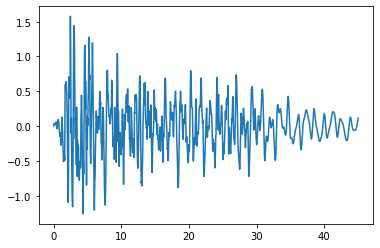

In [23]:
plt.plot(runTime,topAccel)